In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 2.1 MB/s 
     |████████████████████████████████| 190 kB 13.9 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7165, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (137/137), done.
remote: Total 7165 (delta 46), reused 153 (delta 40), pack-reused 6988
Receiving objects: 100% (7165/7165), 13.42 MiB | 27.55 MiB/s, done.
Resolving deltas: 100% (5228/5228), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-21 06:49:56--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.254.186.233
Connecting to download.openmmlab.com (download.openmmlab.com)|47.254.186.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  10.4MB/s    in 35s     

2022-05-21 06:50:31 (9.04 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = [dict(type='DiceLoss', loss_weight = 1.0),
                                     dict(type='FocalLoss', loss_weight = 1.0)]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='DiceLoss', loss_weight=1.0),
            dict(type='FocalLoss', loss_

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-21 06:50:35,969 - mmseg - INFO - Loaded 537 images
2022-05-21 06:50:50,163 - mmseg - INFO - Loaded 113 images
2022-05-21 06:50:50,166 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-21 06:50:50,604 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([2]).
2022-05-21 06:50:50,609 - mmseg - INFO - Start running, host: root@c76b84ce1e34, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal
2022-05-21 06:50:50,611 - mmseg - INFO - Hooks will be executed in the following order:
befor

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 739s, ETA:     0s

2022-05-21 07:14:57,856 - mmseg - INFO - per class results:
2022-05-21 07:14:57,858 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.69 | 92.69 |
|  building  | 74.18 | 85.52 |
+------------+-------+-------+
2022-05-21 07:14:57,858 - mmseg - INFO - Summary:
2022-05-21 07:14:57,861 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 90.37 | 80.43 | 89.1 |
+-------+-------+------+
2022-05-21 07:14:57,863 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9037, mIoU: 0.8043, mAcc: 0.8910, IoU.background: 0.8669, IoU.building: 0.7418, Acc.background: 0.9269, Acc.building: 0.8552
2022-05-21 07:15:38,962 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 7:06:11, time: 7.805, data_time: 7.420, memory: 3323, decode.loss_dice: 0.1108, decode.loss_focal: 0.0403, decode.acc_seg: 88.2062, loss: 0.1512
2022-05-21 07:16:17,814 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 6:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 700s, ETA:     0s

2022-05-21 07:33:18,543 - mmseg - INFO - per class results:
2022-05-21 07:33:18,545 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.24 | 96.03 |
|  building  | 77.64 | 84.08 |
+------------+-------+-------+
2022-05-21 07:33:18,546 - mmseg - INFO - Summary:
2022-05-21 07:33:18,548 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.16 | 83.44 | 90.06 |
+-------+-------+-------+
2022-05-21 07:33:18,549 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9216, mIoU: 0.8344, mAcc: 0.9006, IoU.background: 0.8924, IoU.building: 0.7764, Acc.background: 0.9603, Acc.building: 0.8408
2022-05-21 07:33:57,499 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 6:07:29, time: 7.390, data_time: 7.006, memory: 3323, decode.loss_dice: 0.0869, decode.loss_focal: 0.0317, decode.acc_seg: 90.6288, loss: 0.1185
2022-05-21 07:34:38,260 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 07:51:35,136 - mmseg - INFO - per class results:
2022-05-21 07:51:35,137 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.43 |  93.6 |
|  building  | 79.59 | 90.24 |
+------------+-------+-------+
2022-05-21 07:51:35,139 - mmseg - INFO - Summary:
2022-05-21 07:51:35,141 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.51 | 84.51 | 91.92 |
+-------+-------+-------+
2022-05-21 07:51:35,143 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9251, mIoU: 0.8451, mAcc: 0.9192, IoU.background: 0.8943, IoU.building: 0.7959, Acc.background: 0.9360, Acc.building: 0.9024
2022-05-21 07:52:13,947 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 5:34:39, time: 7.376, data_time: 6.993, memory: 3323, decode.loss_dice: 0.0729, decode.loss_focal: 0.0288, decode.acc_seg: 91.8648, loss: 0.1017
2022-05-21 07:52:52,577 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 700s, ETA:     0s

2022-05-21 08:09:53,450 - mmseg - INFO - per class results:
2022-05-21 08:09:53,452 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.75 |  94.2 |
|  building  | 79.93 | 89.63 |
+------------+-------+-------+
2022-05-21 08:09:53,453 - mmseg - INFO - Summary:
2022-05-21 08:09:53,455 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.72 | 84.84 | 91.91 |
+-------+-------+-------+
2022-05-21 08:09:53,457 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9272, mIoU: 0.8484, mAcc: 0.9191, IoU.background: 0.8975, IoU.building: 0.7993, Acc.background: 0.9420, Acc.building: 0.8963
2022-05-21 08:10:32,243 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 5:09:02, time: 7.388, data_time: 7.006, memory: 3323, decode.loss_dice: 0.0766, decode.loss_focal: 0.0271, decode.acc_seg: 92.4474, loss: 0.1036
2022-05-21 08:11:10,946 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 08:28:09,922 - mmseg - INFO - per class results:
2022-05-21 08:28:09,924 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.43 | 96.01 |
|  building  |  80.4 | 87.11 |
+------------+-------+-------+
2022-05-21 08:28:09,925 - mmseg - INFO - Summary:
2022-05-21 08:28:09,927 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.13 | 85.42 | 91.56 |
+-------+-------+-------+
2022-05-21 08:28:09,930 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9313, mIoU: 0.8542, mAcc: 0.9156, IoU.background: 0.9043, IoU.building: 0.8040, Acc.background: 0.9601, Acc.building: 0.8711
2022-05-21 08:28:48,886 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 4:46:13, time: 7.377, data_time: 6.993, memory: 3323, decode.loss_dice: 0.0771, decode.loss_focal: 0.0282, decode.acc_seg: 91.8339, loss: 0.1053
2022-05-21 08:29:27,647 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 08:46:28,678 - mmseg - INFO - per class results:
2022-05-21 08:46:28,679 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.35 | 94.76 |
|  building  | 80.92 | 89.79 |
+------------+-------+-------+
2022-05-21 08:46:28,680 - mmseg - INFO - Summary:
2022-05-21 08:46:28,683 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.15 | 85.64 | 92.28 |
+-------+-------+-------+
2022-05-21 08:46:28,685 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9315, mIoU: 0.8564, mAcc: 0.9228, IoU.background: 0.9035, IoU.building: 0.8092, Acc.background: 0.9476, Acc.building: 0.8979
2022-05-21 08:47:07,583 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 4:24:58, time: 7.378, data_time: 6.995, memory: 3323, decode.loss_dice: 0.0666, decode.loss_focal: 0.0249, decode.acc_seg: 92.8768, loss: 0.0914
2022-05-21 08:47:46,551 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 09:04:45,739 - mmseg - INFO - per class results:
2022-05-21 09:04:45,741 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.72 | 95.24 |
|  building  | 81.48 | 89.58 |
+------------+-------+-------+
2022-05-21 09:04:45,742 - mmseg - INFO - Summary:
2022-05-21 09:04:45,746 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.41 | 86.1 | 92.41 |
+-------+------+-------+
2022-05-21 09:04:45,748 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9341, mIoU: 0.8610, mAcc: 0.9241, IoU.background: 0.9072, IoU.building: 0.8148, Acc.background: 0.9524, Acc.building: 0.8958
2022-05-21 09:05:24,638 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 4:04:29, time: 7.379, data_time: 6.995, memory: 3323, decode.loss_dice: 0.0651, decode.loss_focal: 0.0261, decode.acc_seg: 93.0136, loss: 0.0912
2022-05-21 09:06:03,502 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 4:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 09:23:00,344 - mmseg - INFO - per class results:
2022-05-21 09:23:00,345 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.66 | 95.47 |
|  building  |  81.2 | 88.89 |
+------------+-------+-------+
2022-05-21 09:23:00,347 - mmseg - INFO - Summary:
2022-05-21 09:23:00,349 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.34 | 85.93 | 92.18 |
+-------+-------+-------+
2022-05-21 09:23:00,351 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9334, mIoU: 0.8593, mAcc: 0.9218, IoU.background: 0.9066, IoU.building: 0.8120, Acc.background: 0.9547, Acc.building: 0.8889
2022-05-21 09:23:41,468 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 3:44:33, time: 7.397, data_time: 7.012, memory: 3323, decode.loss_dice: 0.0702, decode.loss_focal: 0.0251, decode.acc_seg: 92.3075, loss: 0.0953
2022-05-21 09:24:20,568 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 09:41:20,022 - mmseg - INFO - per class results:
2022-05-21 09:41:20,024 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.99 |  95.9 |
|  building  | 81.72 | 88.72 |
+------------+-------+-------+
2022-05-21 09:41:20,025 - mmseg - INFO - Summary:
2022-05-21 09:41:20,026 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.58 | 86.36 | 92.31 |
+-------+-------+-------+
2022-05-21 09:41:20,029 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9358, mIoU: 0.8636, mAcc: 0.9231, IoU.background: 0.9099, IoU.building: 0.8172, Acc.background: 0.9590, Acc.building: 0.8872
2022-05-21 09:41:59,010 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 3:24:59, time: 7.384, data_time: 6.999, memory: 3323, decode.loss_dice: 0.0636, decode.loss_focal: 0.0224, decode.acc_seg: 93.1702, loss: 0.0859
2022-05-21 09:42:39,986 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 09:59:37,816 - mmseg - INFO - per class results:
2022-05-21 09:59:37,819 - mmseg - INFO - 
+------------+------+-------+
|   Class    | IoU  |  Acc  |
+------------+------+-------+
| background | 90.9 |  94.6 |
|  building  | 82.2 | 91.48 |
+------------+------+-------+
2022-05-21 09:59:37,820 - mmseg - INFO - Summary:
2022-05-21 09:59:37,822 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.59 | 86.55 | 93.04 |
+-------+-------+-------+
2022-05-21 09:59:37,824 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9359, mIoU: 0.8655, mAcc: 0.9304, IoU.background: 0.9090, IoU.building: 0.8220, Acc.background: 0.9460, Acc.building: 0.9148
2022-05-21 10:00:17,139 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 3:05:41, time: 7.381, data_time: 6.993, memory: 3323, decode.loss_dice: 0.0594, decode.loss_focal: 0.0210, decode.acc_seg: 93.6562, loss: 0.0804
2022-05-21 10:00:56,188 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 700s, ETA:     0s

2022-05-21 10:17:58,895 - mmseg - INFO - per class results:
2022-05-21 10:17:58,897 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.11 | 95.34 |
|  building  | 82.28 |  90.3 |
+------------+-------+-------+
2022-05-21 10:17:58,898 - mmseg - INFO - Summary:
2022-05-21 10:17:58,902 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.71 | 86.69 | 92.82 |
+-------+-------+-------+
2022-05-21 10:17:58,904 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9371, mIoU: 0.8669, mAcc: 0.9282, IoU.background: 0.9111, IoU.building: 0.8228, Acc.background: 0.9534, Acc.building: 0.9030
2022-05-21 10:18:38,089 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 2:46:36, time: 7.397, data_time: 7.010, memory: 3323, decode.loss_dice: 0.0556, decode.loss_focal: 0.0208, decode.acc_seg: 93.8757, loss: 0.0764
2022-05-21 10:19:17,120 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 10:36:17,543 - mmseg - INFO - per class results:
2022-05-21 10:36:17,544 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.02 | 94.42 |
|  building  | 82.56 | 92.18 |
+------------+-------+-------+
2022-05-21 10:36:17,545 - mmseg - INFO - Summary:
2022-05-21 10:36:17,546 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 93.7 | 86.79 | 93.3 |
+------+-------+------+
2022-05-21 10:36:17,548 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9370, mIoU: 0.8679, mAcc: 0.9330, IoU.background: 0.9102, IoU.building: 0.8256, Acc.background: 0.9442, Acc.building: 0.9218
2022-05-21 10:36:56,503 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 2:27:36, time: 7.377, data_time: 6.993, memory: 3323, decode.loss_dice: 0.0626, decode.loss_focal: 0.0222, decode.acc_seg: 93.4755, loss: 0.0849
2022-05-21 10:37:35,581 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta: 2:24:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 10:54:36,483 - mmseg - INFO - per class results:
2022-05-21 10:54:36,484 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.31 | 96.06 |
|  building  | 82.34 | 89.13 |
+------------+-------+-------+
2022-05-21 10:54:36,485 - mmseg - INFO - Summary:
2022-05-21 10:54:36,488 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.82 | 86.83 | 92.59 |
+-------+-------+-------+
2022-05-21 10:54:36,491 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9382, mIoU: 0.8683, mAcc: 0.9259, IoU.background: 0.9131, IoU.building: 0.8234, Acc.background: 0.9606, Acc.building: 0.8913
2022-05-21 10:55:15,534 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 2:08:44, time: 7.379, data_time: 6.994, memory: 3323, decode.loss_dice: 0.0547, decode.loss_focal: 0.0207, decode.acc_seg: 94.1176, loss: 0.0754
2022-05-21 10:55:54,456 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 11:12:54,426 - mmseg - INFO - per class results:
2022-05-21 11:12:54,428 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.13 | 94.69 |
|  building  | 82.65 | 91.83 |
+------------+-------+-------+
2022-05-21 11:12:54,429 - mmseg - INFO - Summary:
2022-05-21 11:12:54,432 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.76 | 86.89 | 93.26 |
+-------+-------+-------+
2022-05-21 11:12:54,434 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9376, mIoU: 0.8689, mAcc: 0.9326, IoU.background: 0.9113, IoU.building: 0.8265, Acc.background: 0.9469, Acc.building: 0.9183
2022-05-21 11:13:33,464 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:49:55, time: 7.376, data_time: 6.991, memory: 3323, decode.loss_dice: 0.0567, decode.loss_focal: 0.0205, decode.acc_seg: 93.9153, loss: 0.0772
2022-05-21 11:14:12,428 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 11:31:10,419 - mmseg - INFO - per class results:
2022-05-21 11:31:10,421 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.36 |  95.9 |
|  building  | 82.53 | 89.59 |
+------------+-------+-------+
2022-05-21 11:31:10,422 - mmseg - INFO - Summary:
2022-05-21 11:31:10,423 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.86 | 86.94 | 92.75 |
+-------+-------+-------+
2022-05-21 11:31:10,425 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9386, mIoU: 0.8694, mAcc: 0.9275, IoU.background: 0.9136, IoU.building: 0.8253, Acc.background: 0.9590, Acc.building: 0.8959
2022-05-21 11:31:51,709 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:31:11, time: 7.400, data_time: 7.013, memory: 3323, decode.loss_dice: 0.0582, decode.loss_focal: 0.0211, decode.acc_seg: 93.6204, loss: 0.0793
2022-05-21 11:32:30,549 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 11:49:29,667 - mmseg - INFO - per class results:
2022-05-21 11:49:29,669 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.51 | 95.43 |
|  building  |  83.1 | 91.04 |
+------------+-------+-------+
2022-05-21 11:49:29,671 - mmseg - INFO - Summary:
2022-05-21 11:49:29,672 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 94.01 | 87.3 | 93.23 |
+-------+------+-------+
2022-05-21 11:49:29,676 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9401, mIoU: 0.8730, mAcc: 0.9323, IoU.background: 0.9151, IoU.building: 0.8310, Acc.background: 0.9543, Acc.building: 0.9104
2022-05-21 11:50:08,707 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 1:12:30, time: 7.382, data_time: 6.997, memory: 3323, decode.loss_dice: 0.0551, decode.loss_focal: 0.0203, decode.acc_seg: 93.9496, loss: 0.0754
2022-05-21 11:50:49,930 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 12:07:49,094 - mmseg - INFO - per class results:
2022-05-21 12:07:49,096 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.34 | 95.59 |
|  building  | 82.64 | 90.27 |
+------------+-------+-------+
2022-05-21 12:07:49,100 - mmseg - INFO - Summary:
2022-05-21 12:07:49,101 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.87 | 86.99 | 92.93 |
+-------+-------+-------+
2022-05-21 12:07:49,103 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9387, mIoU: 0.8699, mAcc: 0.9293, IoU.background: 0.9134, IoU.building: 0.8264, Acc.background: 0.9559, Acc.building: 0.9027
2022-05-21 12:08:28,240 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:53:51, time: 7.377, data_time: 6.991, memory: 3323, decode.loss_dice: 0.0565, decode.loss_focal: 0.0229, decode.acc_seg: 94.0800, loss: 0.0793
2022-05-21 12:09:09,571 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 12:26:10,325 - mmseg - INFO - per class results:
2022-05-21 12:26:10,327 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.62 | 95.77 |
|  building  | 83.17 | 90.52 |
+------------+-------+-------+
2022-05-21 12:26:10,329 - mmseg - INFO - Summary:
2022-05-21 12:26:10,332 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.07 | 87.39 | 93.15 |
+-------+-------+-------+
2022-05-21 12:26:10,336 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9407, mIoU: 0.8739, mAcc: 0.9315, IoU.background: 0.9162, IoU.building: 0.8317, Acc.background: 0.9577, Acc.building: 0.9052
2022-05-21 12:26:49,714 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:35:16, time: 7.386, data_time: 6.998, memory: 3323, decode.loss_dice: 0.0624, decode.loss_focal: 0.0213, decode.acc_seg: 93.6420, loss: 0.0837
2022-05-21 12:27:29,066 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 12:44:30,637 - mmseg - INFO - per class results:
2022-05-21 12:44:30,639 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.53 | 95.41 |
|  building  | 83.17 | 91.15 |
+------------+-------+-------+
2022-05-21 12:44:30,640 - mmseg - INFO - Summary:
2022-05-21 12:44:30,641 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.03 | 87.35 | 93.28 |
+-------+-------+-------+
2022-05-21 12:44:30,643 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9403, mIoU: 0.8735, mAcc: 0.9328, IoU.background: 0.9153, IoU.building: 0.8317, Acc.background: 0.9541, Acc.building: 0.9115
2022-05-21 12:45:09,870 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:16:41, time: 7.381, data_time: 6.994, memory: 3323, decode.loss_dice: 0.0575, decode.loss_focal: 0.0214, decode.acc_seg: 93.6087, loss: 0.0789
2022-05-21 12:45:48,917 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 699s, ETA:     0s

2022-05-21 13:02:50,856 - mmseg - INFO - per class results:
2022-05-21 13:02:50,858 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.48 | 95.11 |
|  building  | 83.19 |  91.7 |
+------------+-------+-------+
2022-05-21 13:02:50,860 - mmseg - INFO - Summary:
2022-05-21 13:02:50,864 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 94.0 | 87.33 | 93.4 |
+------+-------+------+
2022-05-21 13:02:50,866 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9400, mIoU: 0.8733, mAcc: 0.9340, IoU.background: 0.9148, IoU.building: 0.8319, Acc.background: 0.9511, Acc.building: 0.9170


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


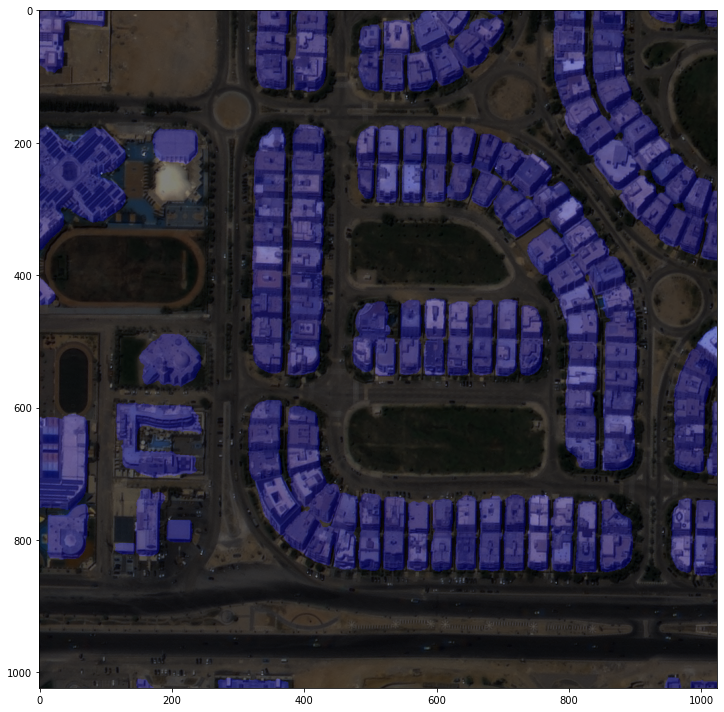

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


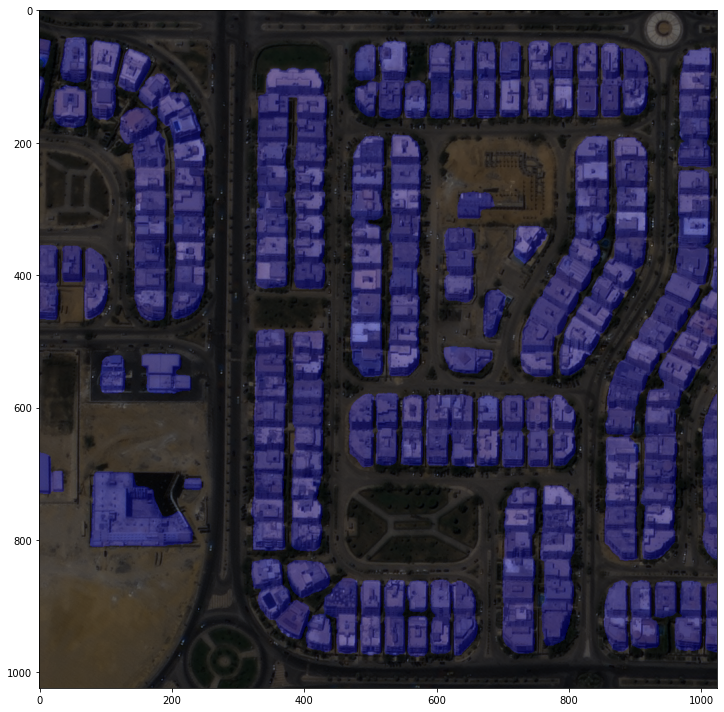

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


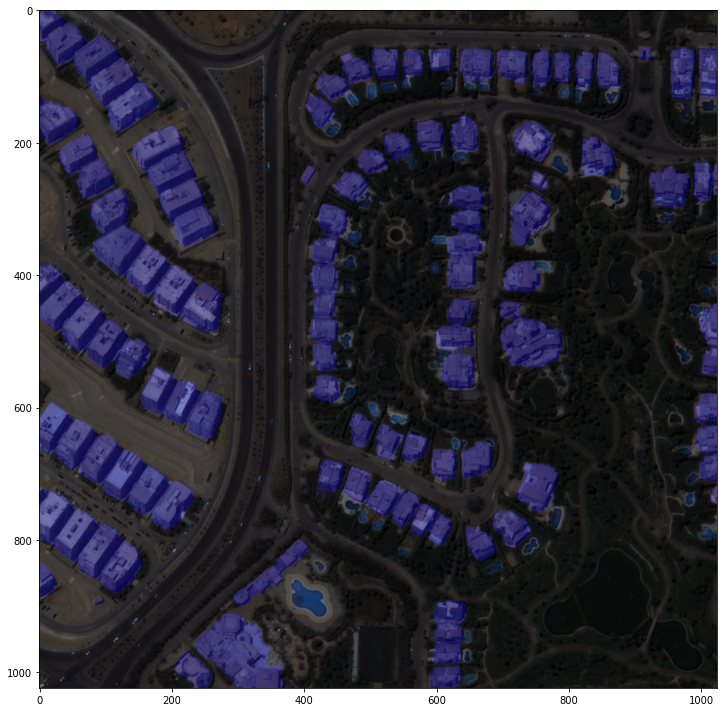

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


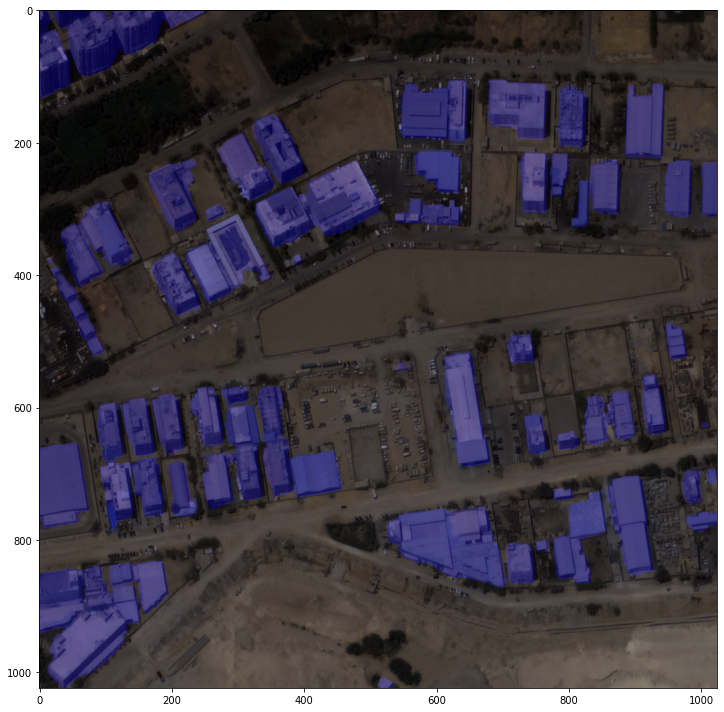

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


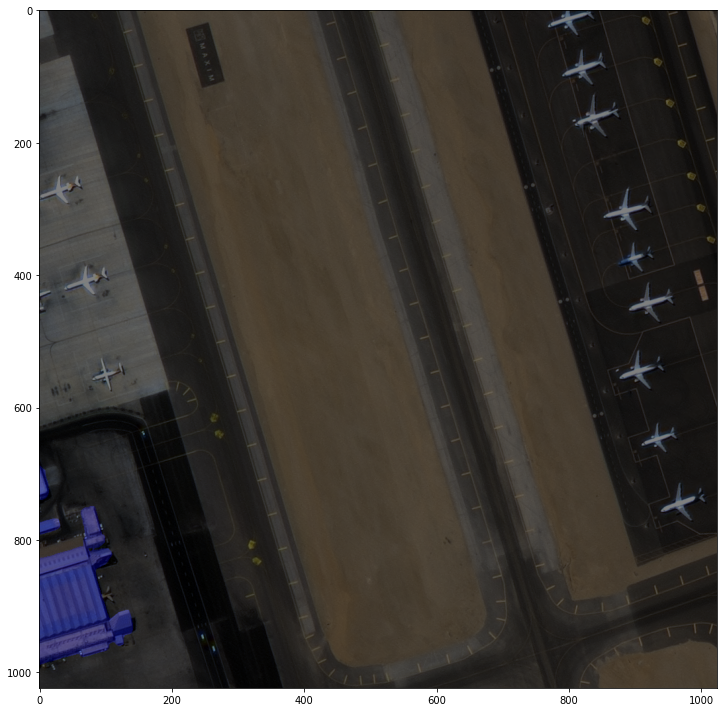

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


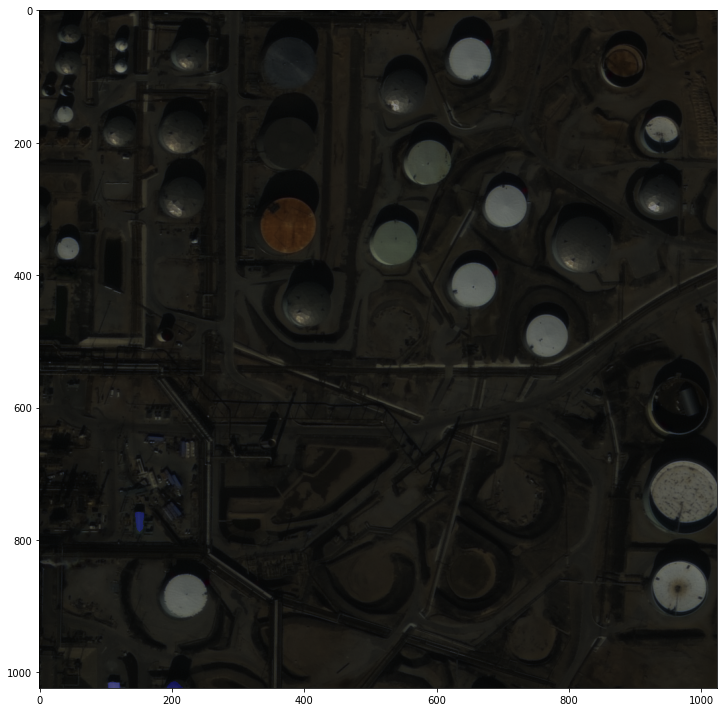

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


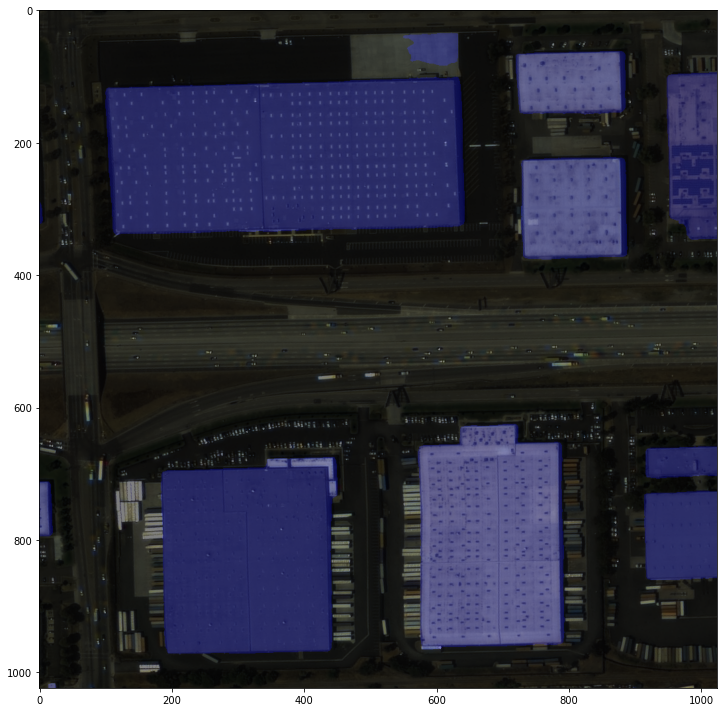

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


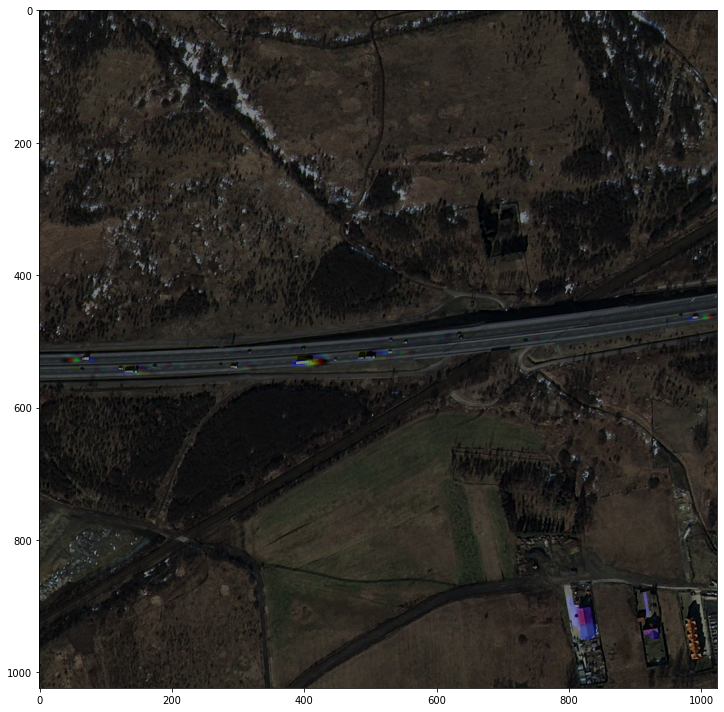

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


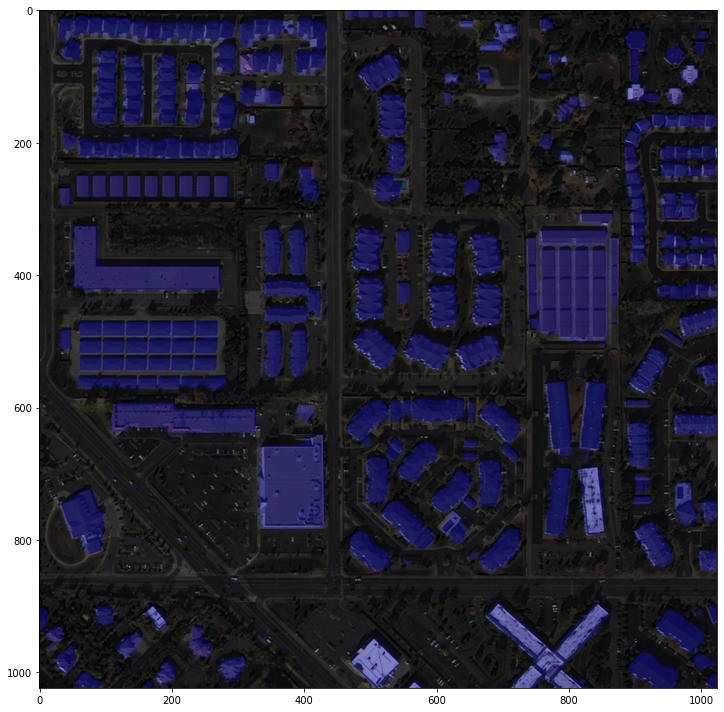

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


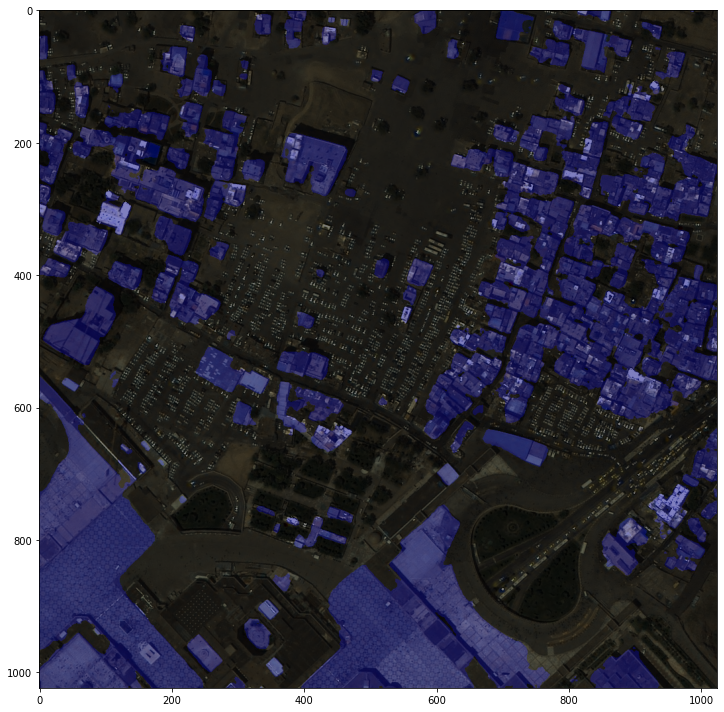

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


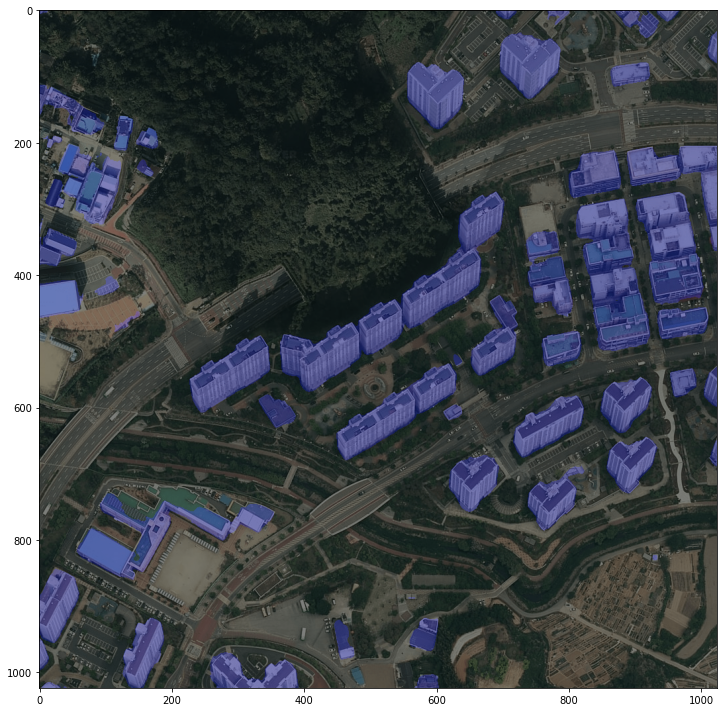

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


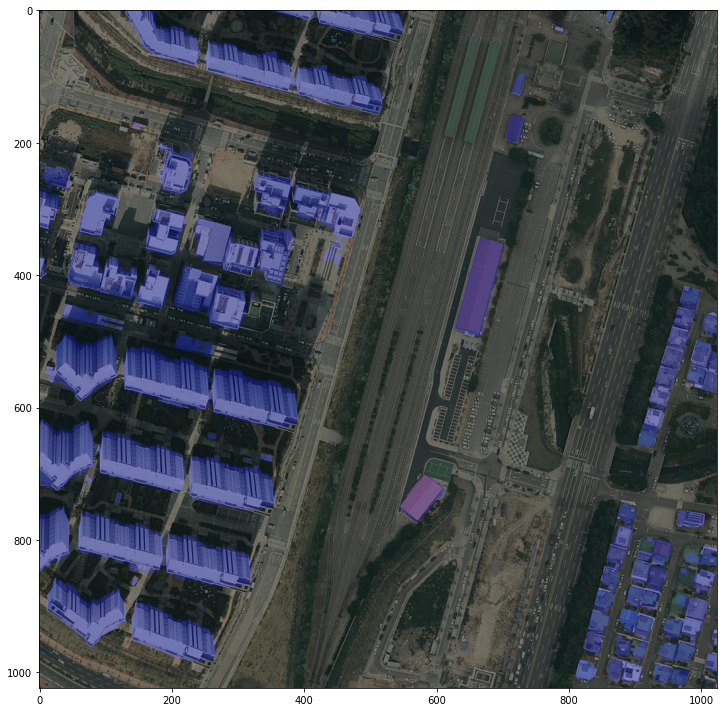

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


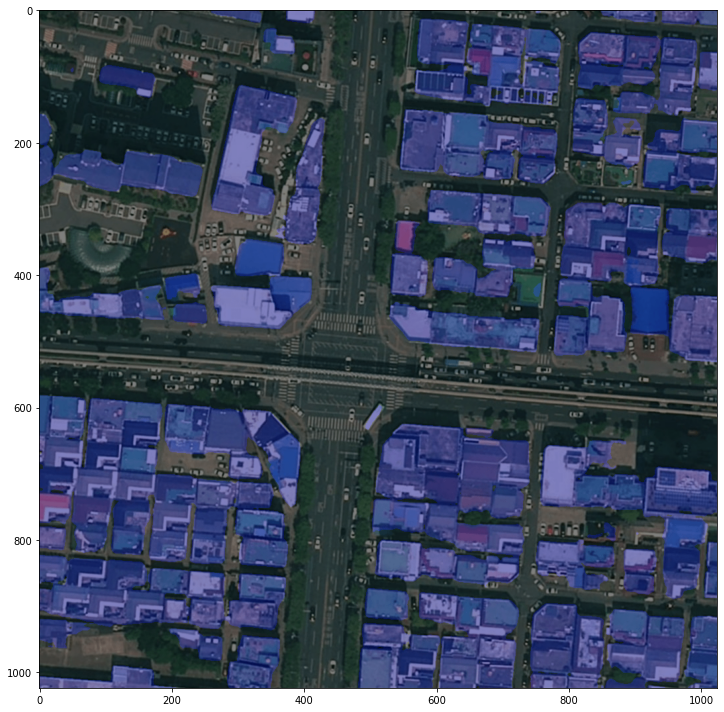

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


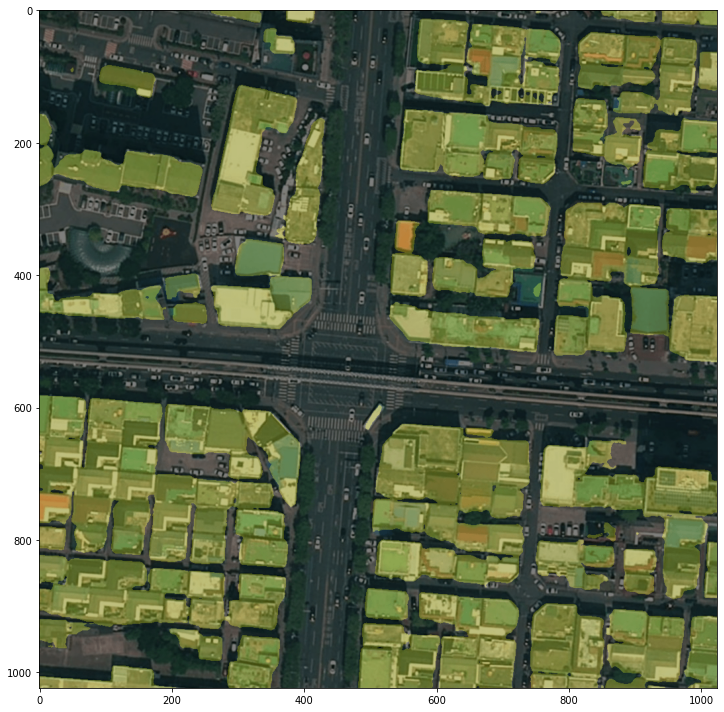

In [29]:
palette_1 = [[0, 0, 0], [128, 128, 0]]
show_result_pyplot(model_ckpt, img, result, palette_1)
